### step - 1

### Advanced Lane Finding Project
The goals / steps of this project are the following:
1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
2. Apply a distortion correction to raw images.
3. Use color transforms, gradients, etc., to create a thresholded binary image.
4. Apply a perspective transform to rectify binary image ("birds-eye view").
5. Detect lane pixels and fit to find the lane boundary.
6. Determine the curvature of the lane and vehicle position with respect to center.
7. Warp the detected lane boundaries back onto the original image.
8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

1. Creating the 3d objPoints and imgPoints.
2. using findChessboardCorners to detect the corners in the image
3. Drawing the detected corners on the image.

In [1]:
# Camera Calibration matrix and distortion coefiicients 
import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline
print("Completed")

Completed


Completed


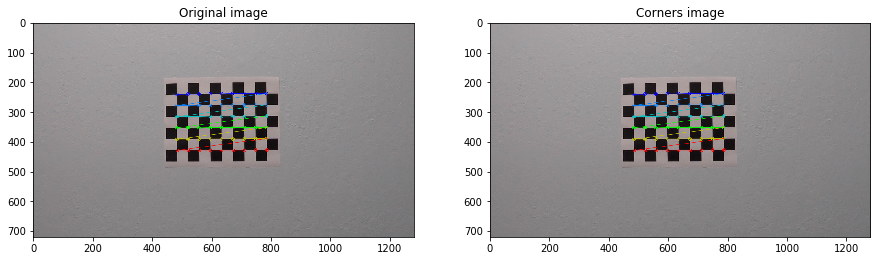

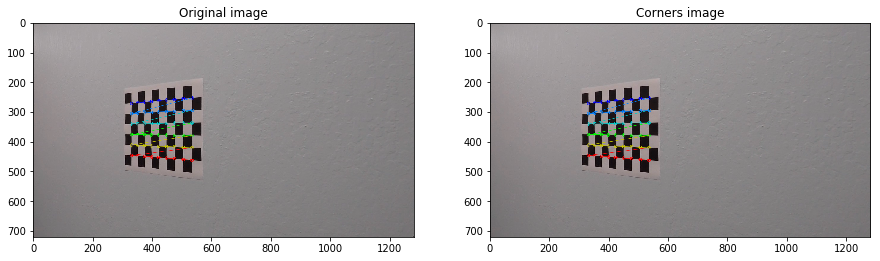

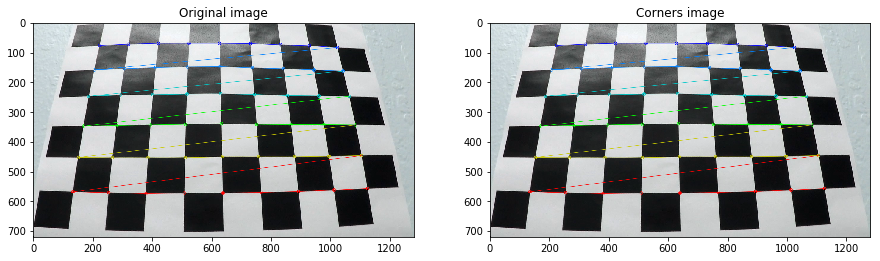

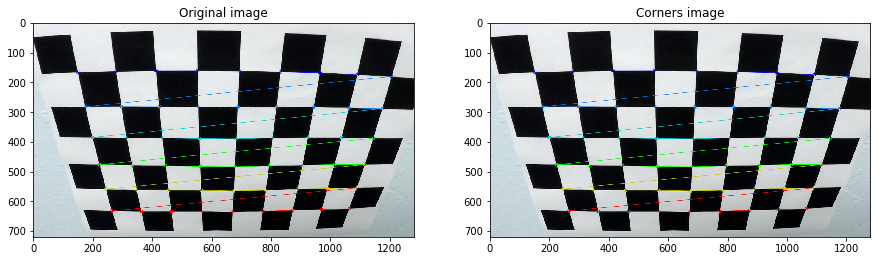

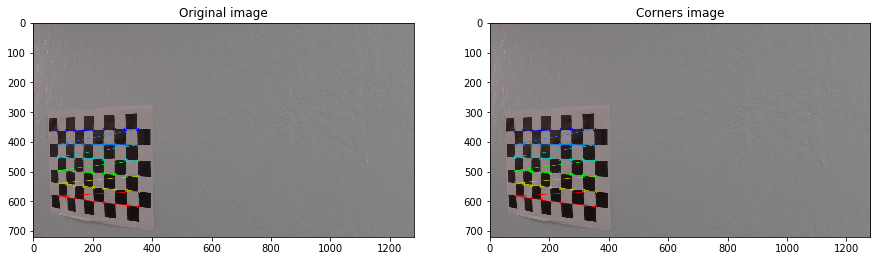

...

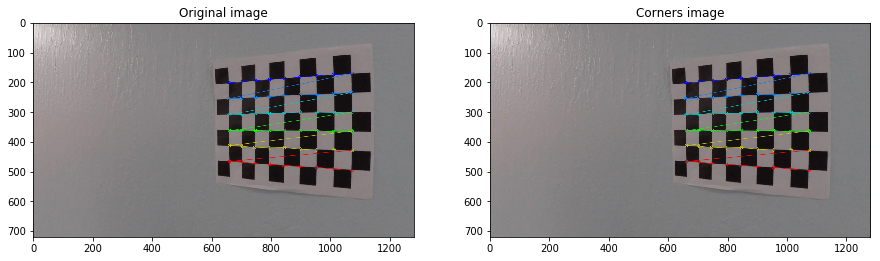

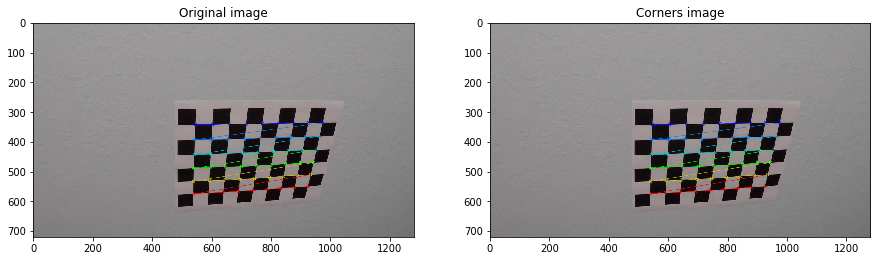

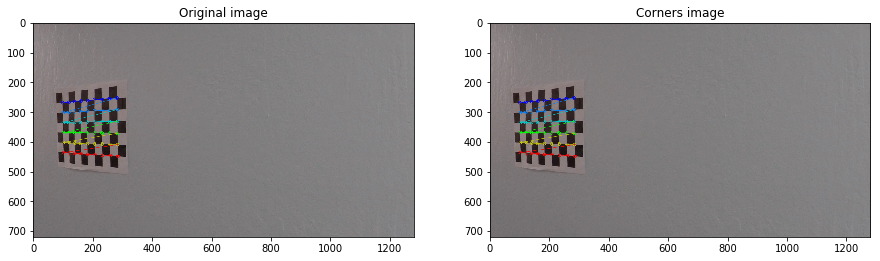

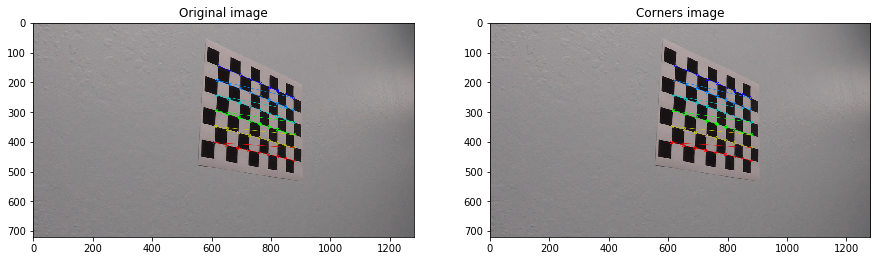

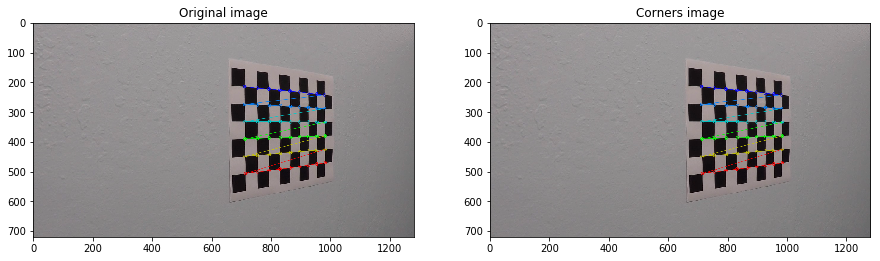

In [2]:
# Arrays to store object points and image points from all the images
objPoints = []
imgPoints = []
 
# prepare object points 
objP = np.zeros((6*9,3), np.float32)
objP[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) 

imgContainer = glob.glob('camera_cal/*.jpg')

## finding and drawing the image corners on the image
for i, imgName in enumerate(imgContainer):
    image = cv2.imread(imgName)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    
    if ret == True:
        imgPoints.append(corners)
        objPoints.append(objP)
        f, (axs1, axs2) = plt.subplots(1, 2, figsize=(15,11))
        img = cv2.drawChessboardCorners(image, (9,6), corners, ret)
        axs1.set_title("Original image")
        axs1.imshow(image)
        axs2.set_title("Corners image")
        axs2.imshow(img)



print("Completed")

### step - 2

### Camera Calibration
1. I have used OpenCV functions findChessboardCorners and calibrateCamera for the image calibration.
2. Input consited of chessboar patterns with different angles, color etc.
3. Detecting chessboard corners
4. Drawing the chessboard corners using the openCV functions.
Undistort function to undistort the image.

In [3]:
def cal_undistort(img):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst
print("Completed")

Completed


Text(0.5,1,'Undistorted Image')

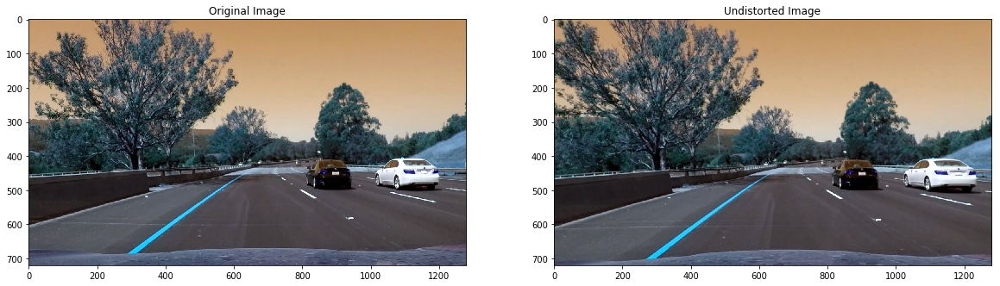

In [4]:
## testImage
test_image = cv2.imread('./test_images/test6.jpg')
img_size = (test_image.shape[1], test_image.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, img_size, None, None)
dst = cv2.undistort(test_image, mtx, dist, None, mtx)

dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "calibration.p", "wb" ) )

# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(test_image)
ax1.set_title('Original Image')
ax2.imshow(dst)
ax2.set_title('Undistorted Image')

Completed


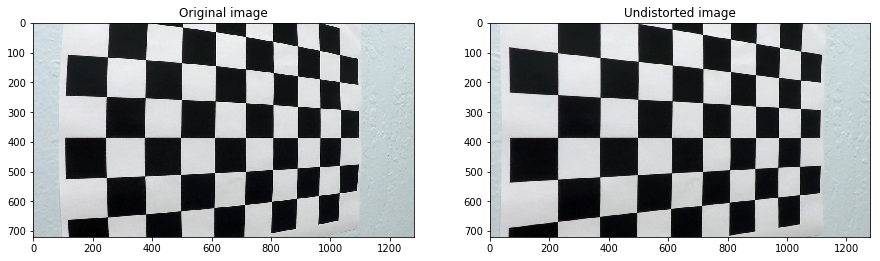

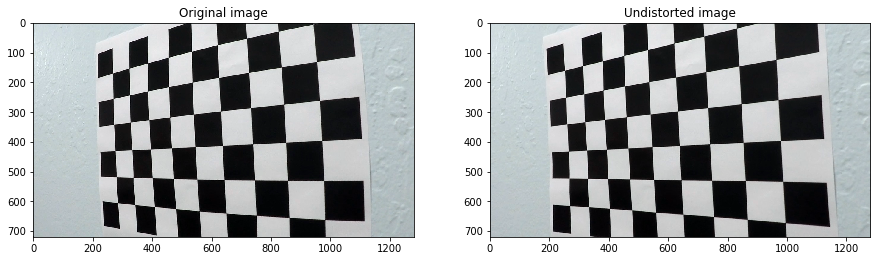

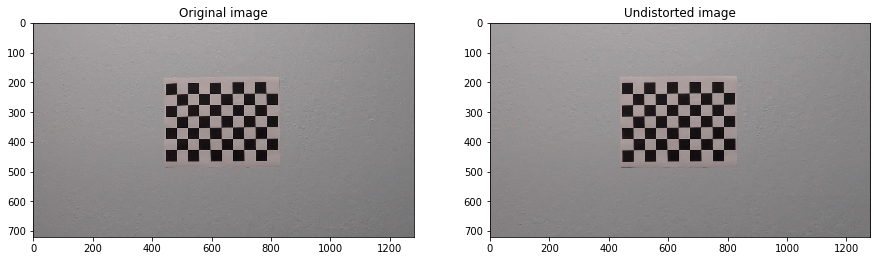

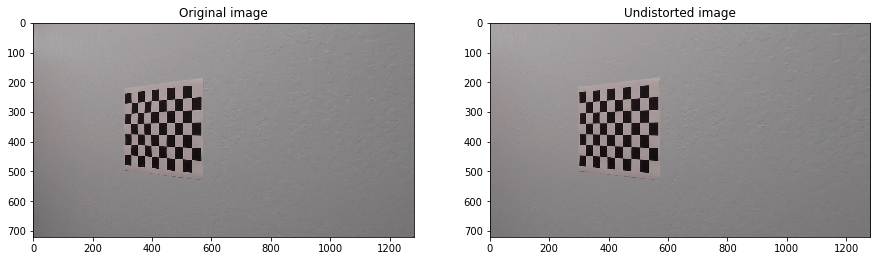

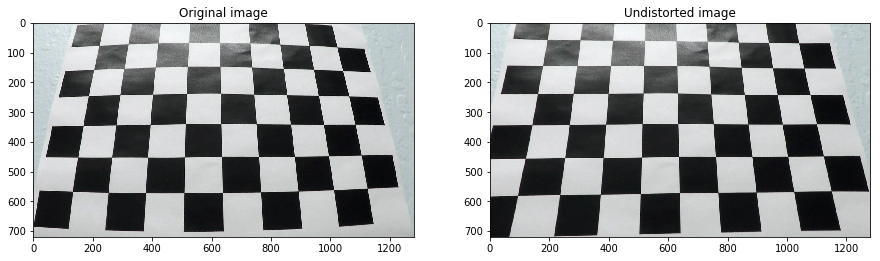

...

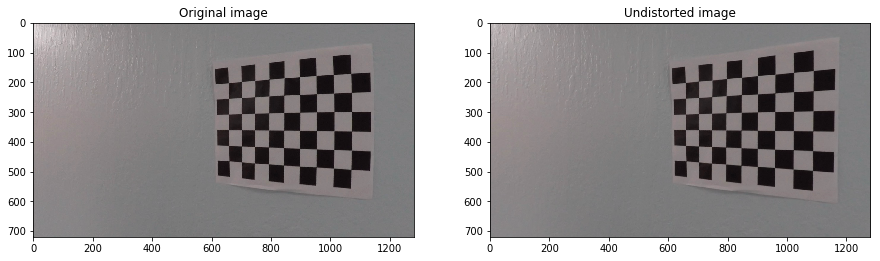

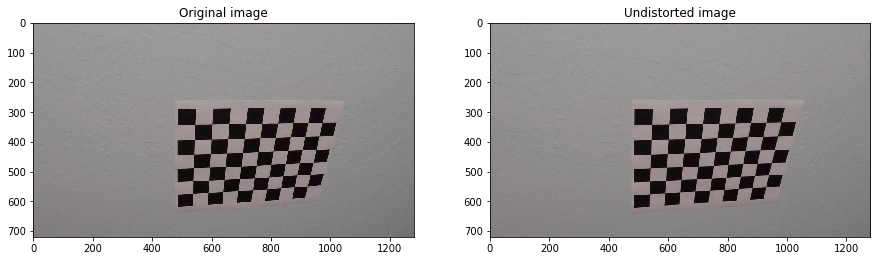

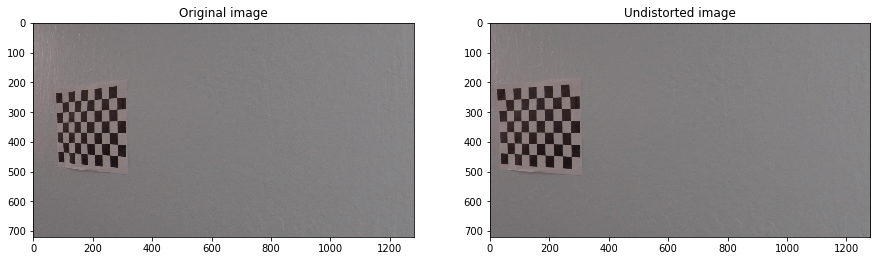

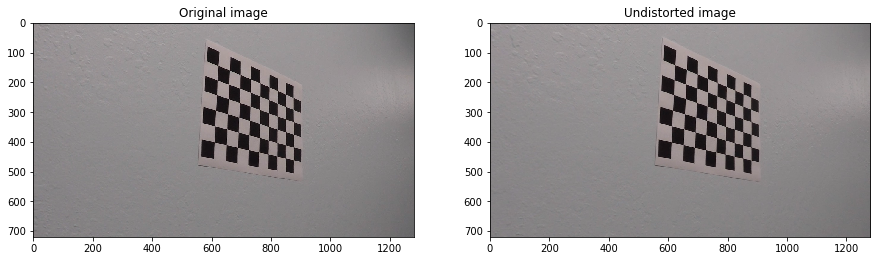

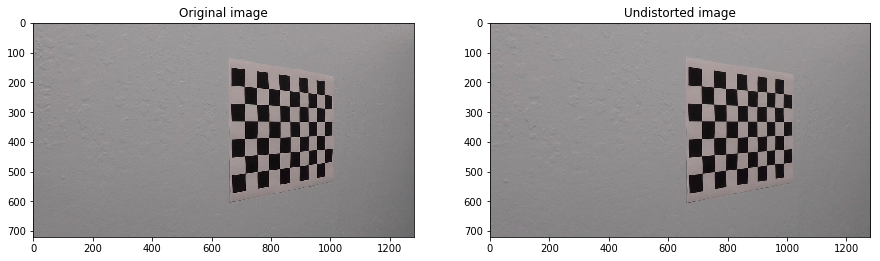

In [5]:
## applying the undistorting to each individual images
for image in imgContainer:
    img = cv2.imread(image)
    undistort = cal_undistort(img)
    f, (axs1, axs2) = plt.subplots(1, 2, figsize=(15,11))
    axs1.set_title("Original image")
    axs1.imshow(img)
    axs2.set_title("Undistorted image")
    axs2.imshow(undistort)

print("Completed")

### step - 3 Creating bird's eye view - Perspective transform

### Perspective transform
1. A perspective transform maps the points in a given image to different, desired, image points with a new perspective
2. Select 4 source points according to a given image and its content
2. Select 4 destination points like rectangle
Now we do a perspective transfrom to get a bird's eye view

Completed


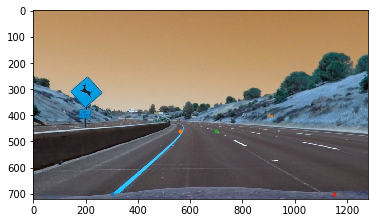

In [6]:
# defining source points and destination points
imgHolder = glob.glob('test_images/*.jpg')
testImage = cv2.imread('test_images/test2.jpg')
testImage = cal_undistort(testImage)
plt.imshow(testImage)
plt.plot(300,700, '.') #- left bottom
plt.plot(560,460, '.') #- top left
plt.plot(700,460,'.')  #- top right
plt.plot(1150,700,'.') #- right bottom
#srcPoints


def warp(img):
    img_size = (img.shape[1], img.shape[0])    
    # define source and destination points for transform
    srcPoints = np.float32(
                    [(575,464),
                    (707,464), 
                    (258,682), 
                    (1049,682)])
    dstPoints = np.float32(
                    [(450,20),
                    (800,20),
                    (450,700),
                    (800,700)])
    M = cv2.getPerspectiveTransform(srcPoints, dstPoints)
    Minv = cv2.getPerspectiveTransform(dstPoints, srcPoints)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M,  Minv

print("Completed")

Completed


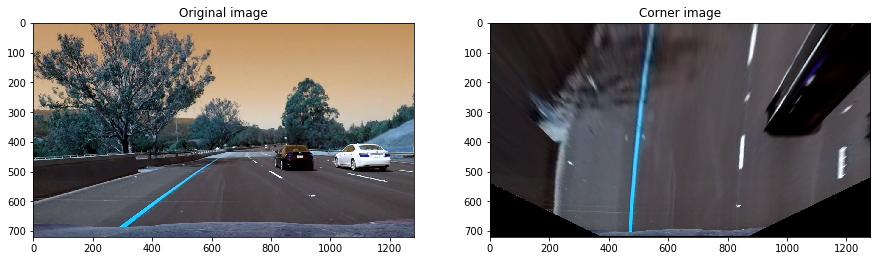

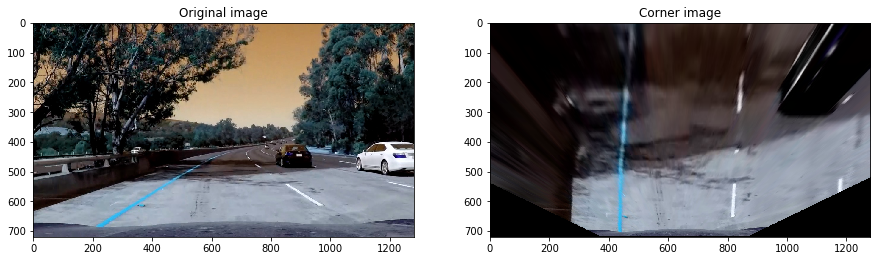

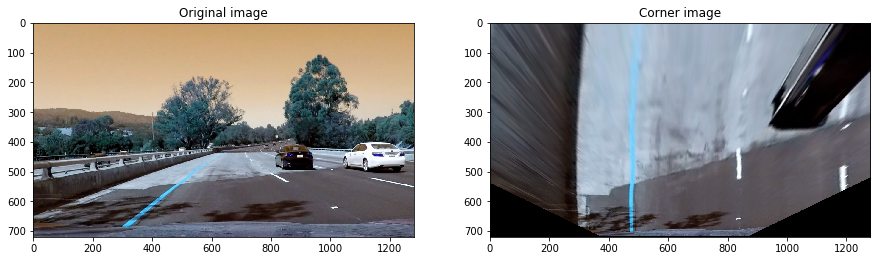

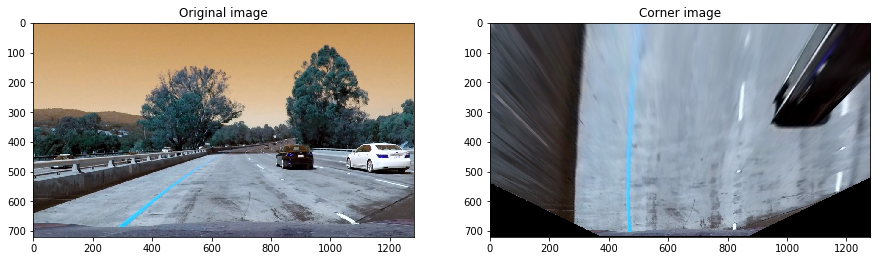

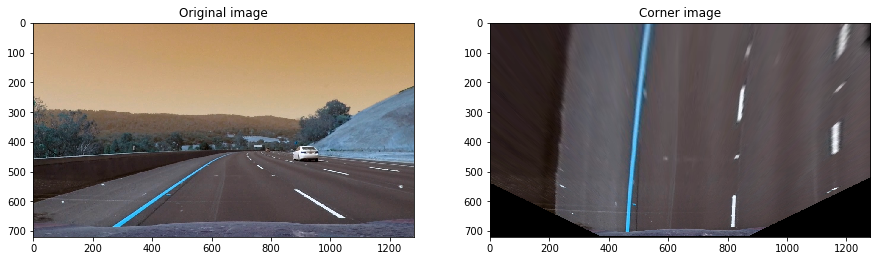

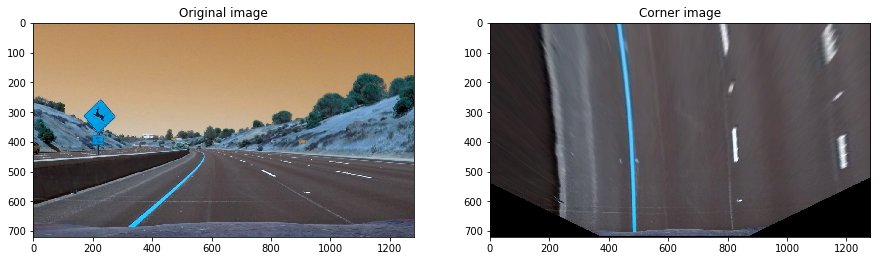

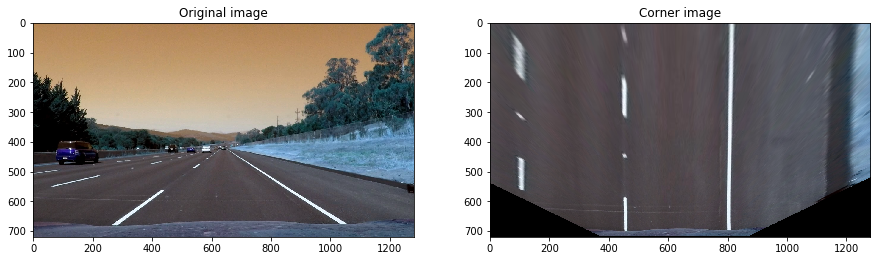

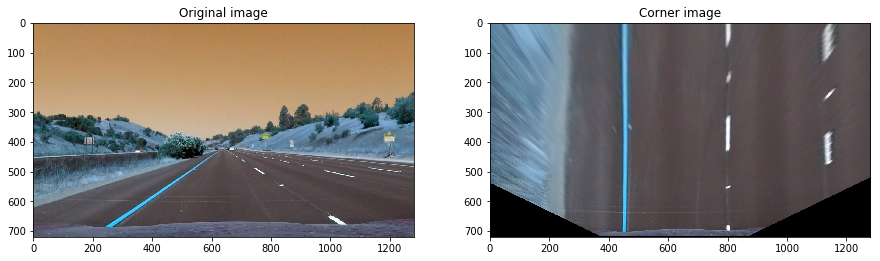

In [7]:
for img in imgHolder:
    image = cv2.imread(img)
    warped, M, Minv = warp(image)
    f, (axs1, axs2) = plt.subplots(1, 2, figsize=(15,11))
    axs1.set_title("Original image")
    axs1.imshow(image)
    axs2.set_title("Corner image")
    axs2.imshow(warped)
    
print("Completed")

Completed


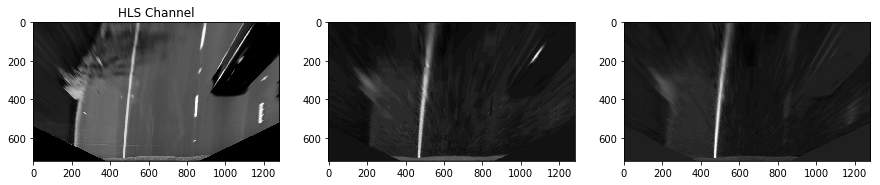

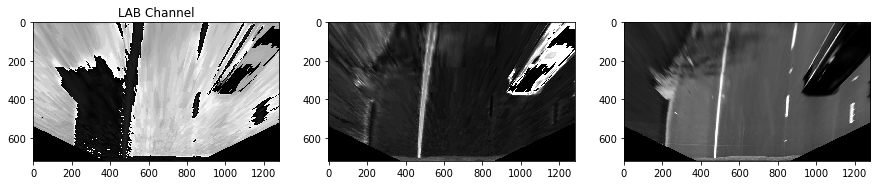

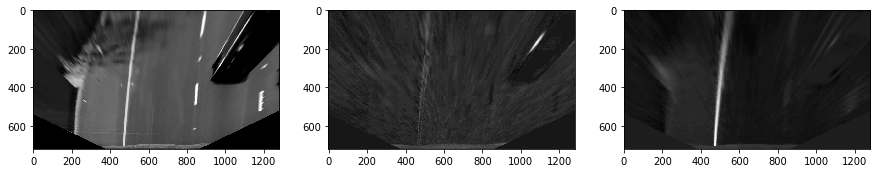

In [8]:
### Color channels 
color_test_image = test_image
color_test_image, M, Minv = warp(color_test_image)
for i in range(3):
    input_image = np.copy(color_test_image)
    if i == 0:
        input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2LUV)
        luv_l_channel = input_image[:,:,0]
        luv_u_channel = input_image[:,:,1]
        luv_v_channel = input_image[:,:,2]
        f, (axs1, axs2, axs3) = plt.subplots(1, 3, figsize=(15,11))
        axs1.set_title("LUV Channel")
        axs1.imshow(luv_l_channel, cmap='gray')
        axs2.imshow(luv_u_channel, cmap='gray')
        axs3.imshow(luv_v_channel, cmap='gray')
    elif i == 1:
        input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2HSV)
        hsv_h_channel = input_image[:,:,0]
        hsv_l_channel = input_image[:,:,1]
        hsv_s_channel = input_image[:,:,2]
        axs1.set_title("HLS Channel")
        f, (axs1, axs2, axs3) = plt.subplots(1, 3, figsize=(15,11))
        axs1.imshow(hsv_h_channel, cmap='gray')
        axs2.imshow(hsv_l_channel, cmap='gray')
        axs3.imshow(hsv_s_channel, cmap='gray')
    elif i == 2:
        input_image = cv2.cvtColor(input_image, cv2.COLOR_BGR2Lab)
        lab_l_channel = input_image[:,:,0]
        lab_a_channel = input_image[:,:,1]
        lab_b_channel = input_image[:,:,2]
        axs1.set_title("LAB Channel")
        f, (axs1, axs2, axs3) = plt.subplots(1, 3, figsize=(15,11))
        axs1.imshow(lab_l_channel, cmap='gray')
        axs2.imshow(lab_a_channel, cmap='gray')
        axs3.imshow(lab_b_channel, cmap='gray')

print("Completed")

### step - 4 Gradient thresholding

### Threshold
1. Here i have used sobel threshold, magnitude threshold and direction threshold on the input images
2. Sobel threshold gives better output with orient as x, and after experimenting the better threshold was 20,100.
3. Similary for magnitude threshold - 3,100
4. Similary for direction threshold - 0.7, 1.3
Much more experimentation can be done using different kernel sizes, differnt thresholds.

In [9]:
## applying sobel operator on the images
def sobel(img, orient='x', thresh_min = 25, thresh_max= 255):
    gray = (cv2.cvtColor(img, cv2.COLOR_RGB2Lab))[:,:,0]
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    #plt.imshow(sxbinary, cmap='gray')
    return sxbinary
print("Completed")

Completed


In [ ]:
for img in imgHolder:
    image = cv2.imread(img)
    image, M, Minv = warp(image)
    outSobel = sobel(image, orient='x', thresh_min=40, thresh_max=120)
    f, (axs1, axs2) = plt.subplots(1, 2, figsize=(15,11))
    axs1.set_title("Original image")
    axs1.imshow(image)
    axs2.set_title("Corner image")
    axs2.imshow(outSobel, cmap='gray')

print("Completed")

In [10]:
## Applying the magnitude threshold
def mag_thresh(img, sobel_kernel=25, thresh_min=25, thresh_max= 100):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= thresh_min) & (gradmag <= thresh_max)] = 1
    return binary_output

print("Completed")

Completed


In [ ]:
for img in imgHolder:
    image = cv2.imread(img)
    image, M, Minv = warp(image)
    magSobel = mag_thresh(image, sobel_kernel=31, thresh_min=40, thresh_max= 100)
    f, (axs1, axs2) = plt.subplots(1, 2, figsize=(15,11))
    axs1.set_title("Original image")
    axs1.imshow(image)
    axs2.set_title("Corner image")
    axs2.imshow(magSobel, cmap='gray')

print("Completed")

In [11]:
## Applying direction threshold
def dir_threshold(img, sobel_kernel=3, thresh=(0, 0.09)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    absgraddir = np.arctan2(np.absolute(abs_sobely), np.absolute(abs_sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

print("Completed")

Completed


In [ ]:
for img in imgHolder:
    image = cv2.imread(img)
    image, M, Minv = warp(image)
    dirSobel= dir_threshold(image, sobel_kernel=31, thresh=(0.07, 0.19))
    f, (axs1, axs2) = plt.subplots(1, 2, figsize=(15,11))
    axs1.set_title("Original image")
    axs1.imshow(image)
    axs2.set_title("Corner image")
    axs2.imshow(dirSobel, cmap='gray')

print("Completed")

### step - 5 combining threshold

### Combined
1. Here i have tried to combined 2 differnt thresholds and then outputting the image.
2. Also i have used the same threshold, kernel sizes as used above.

Completed


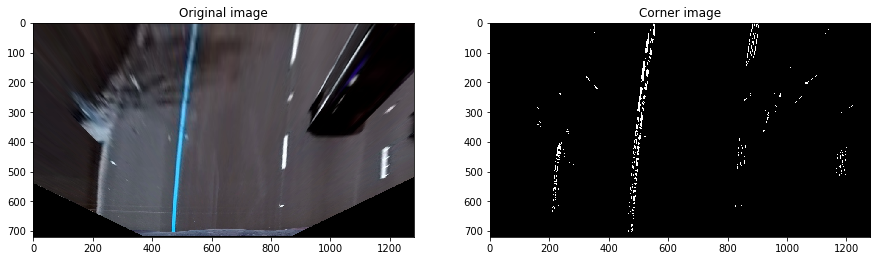

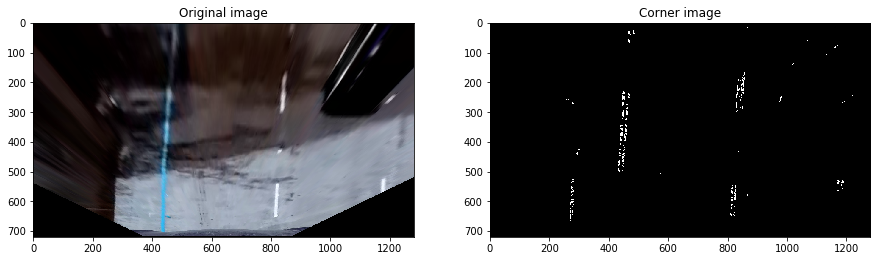

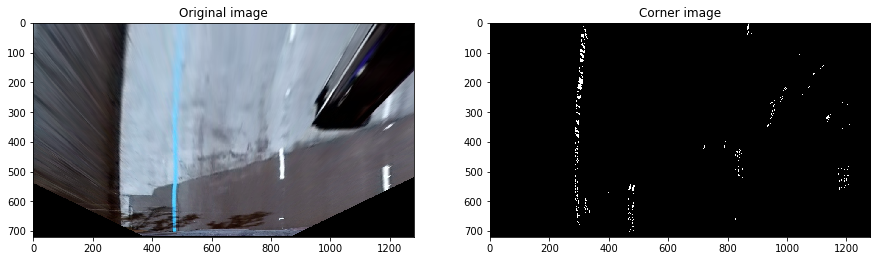

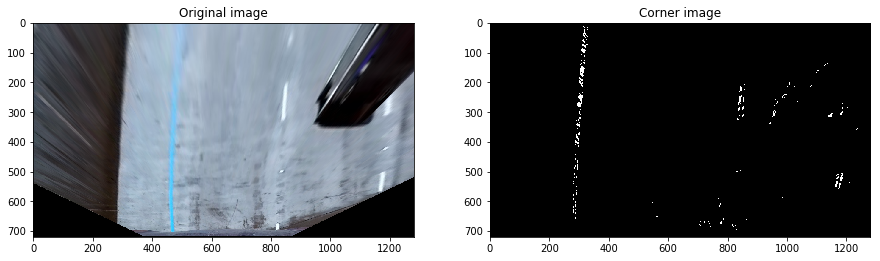

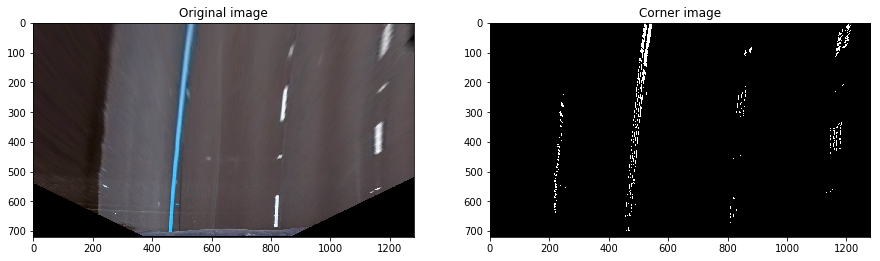

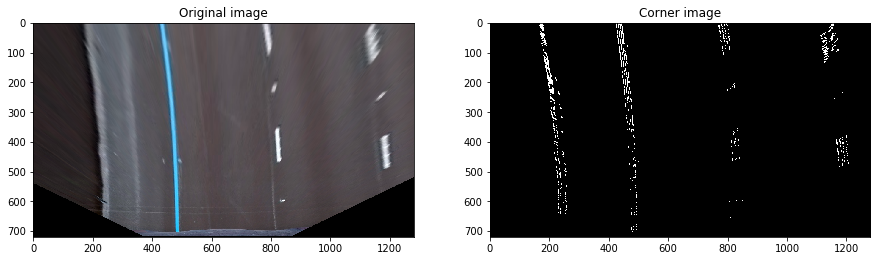

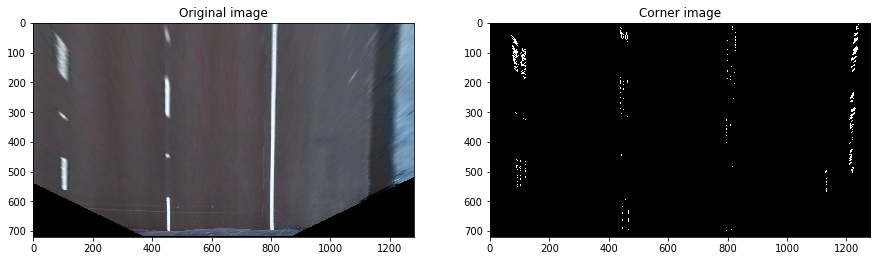

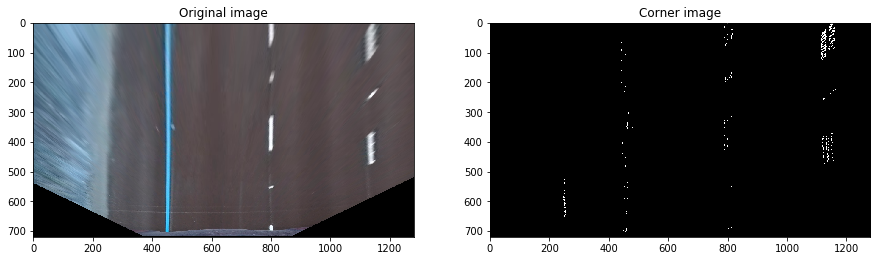

In [12]:
def combined_threshold(img):
    gradx = sobel(image, orient='x', thresh_min= 30, thresh_max = 100)
    grady = sobel(image, orient='y', thresh_min= 30, thresh_max = 100)
    mag_binary = mag_thresh(img, sobel_kernel=31, thresh_min=40, thresh_max= 100)
    dir_binary = dir_threshold(img, sobel_kernel=31, thresh=(0.09, 0.29))
    combined = np.zeros_like(dir_binary)
    combined[((mag_binary == 1) & (dir_binary == 1))] = 1
    
    return combined

for img in imgHolder:
    image = cv2.imread(img)
    image, M, Minv = warp(image)
    combined = combined_threshold(image)
    f, (axs1, axs2) = plt.subplots(1, 2, figsize=(15,11))
    axs1.set_title("Original image")
    axs1.imshow(image)
    axs2.set_title("Corner image")
    axs2.imshow(combined, cmap='gray')

print("Completed")

### step - 6 Color thresholds

### Color threshold explanation
This was the most interesting part of the project. I tried experimenting with different color spaces and different channels with different thresholds.
1. Initially i started with a RGB color image and save its 3 channels in different variables.
2. Applied threshold and then i was able to find that R and G gives better output with most of the images but blue fails to detect yellow lines
3. Next i used HLS color space.
4. Used 3 differnt channel variables for the 3 different channels.
5. H,L, S almost all 3 of them gives better results.
6. L and S were able to detect the lane lines in a better way.
But these outputs can be further improved and experimented with differnt thresholds, differnt cmbinations of thresholds.

Completed


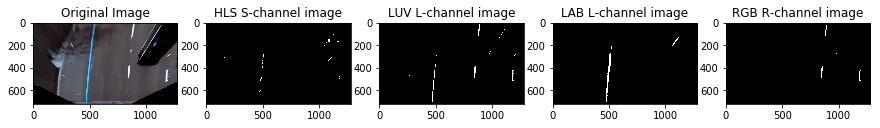

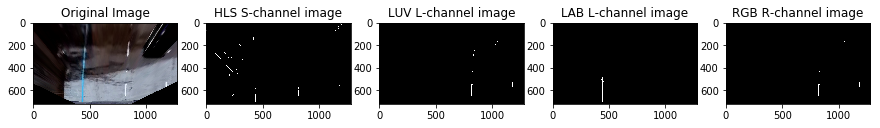

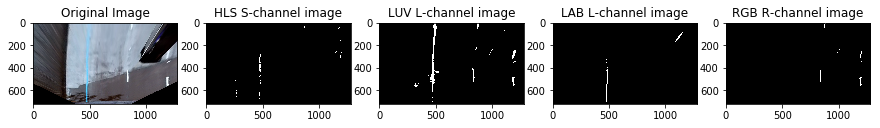

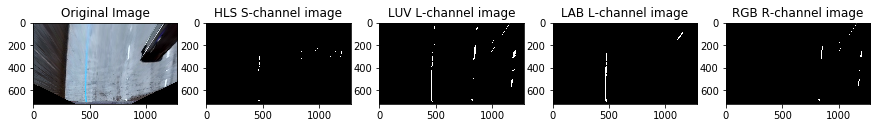

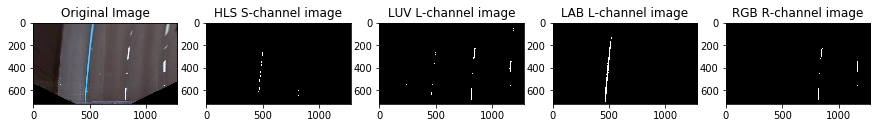

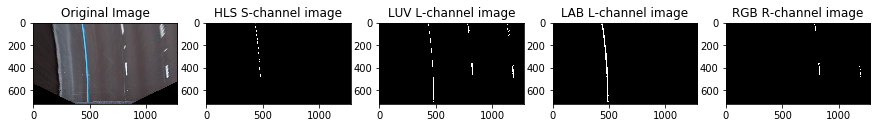

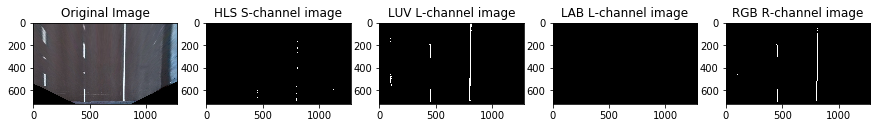

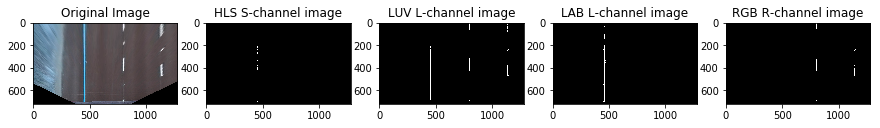

In [25]:
def rgb_thresh(img, thresh=(150,200)):
    R = img[:,:,0] 
    binaryR = np.zeros_like(R)
    binaryR[(R > thresh[0]) & (R <= thresh[1])] = 1
    return binaryR

def hls_thresh(img, thresh=(140, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]    
    binaryS = np.zeros_like(S)
    binaryS[(S > thresh[0]) & (S <= thresh[1])] = 1
    L = hls[:,:,1]    
    binaryL = np.zeros_like(L)
    binaryL[(L > thresh[0]) & (L <= thresh[1])] = 1
    return binaryS, binaryL


# selecting white
def luv_thresh(img):
    luv= cv2.cvtColor(img, cv2.COLOR_BGR2LUV)
    L = luv[:,:,0]
    thresh = (210, 255)
    binaryL = np.zeros_like(L)
    binaryL[(L > thresh[0]) & (L <= thresh[1])] = 1
    V = luv[:,:,2]
    thresh = (180, 225)
    binaryV = np.zeros_like(L)
    binaryV[(V > thresh[0]) & (V <= thresh[1])] = 1
    return binaryL, binaryV

# selecting yellow
def lab_thresh(img, thresh=(140,255)):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    B = lab[:,:,2]
    binaryB = np.zeros_like(B)
    binaryB[(B > thresh[0]) & (B <= thresh[1])] = 1
    return binaryB

for img in imgHolder:
    image = cv2.imread(img)
    image, M, Minv = warp(image)
    
    thresh = (220, 255)
    R = rgb_thresh(image, thresh)
    
    # S_channel threshold value thresh = (120, 225)
    thresh = (210, 240)
    #thresh = (195,255)
    hlsS, hlsL = hls_thresh(image, thresh)
    
    thresh = (25, 100)
    lab = lab_thresh(image, thresh)
    
    luv, luvV = luv_thresh(image)
    
    f, (axs0, axs1, axs2, axs3, axs4) = plt.subplots(1, 5, figsize=(15,11))
    axs0.set_title("Original Image")
    axs0.imshow(image)
    
    axs1.set_title("HLS S-channel image")
    axs1.imshow(hlsS, cmap = 'gray')
    
    axs2.set_title("LUV L-channel image")
    axs2.imshow(luv, cmap='gray')
    
    axs3.set_title("LAB L-channel image")
    axs3.imshow(lab, cmap = 'gray')
    
    axs4.set_title("RGB R-channel image")
    axs4.imshow(R, cmap = 'gray')
    
print("Completed")

In [ ]:
### step - 7 pipeline

Completed


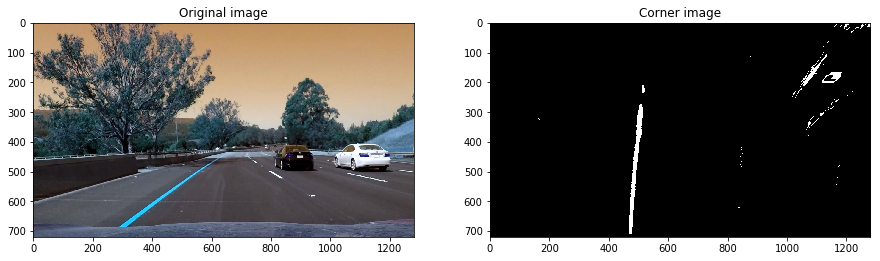

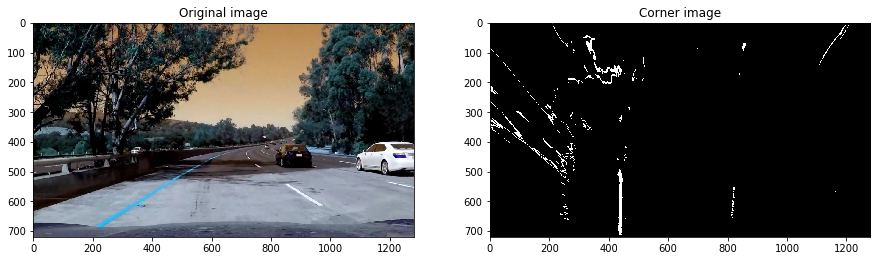

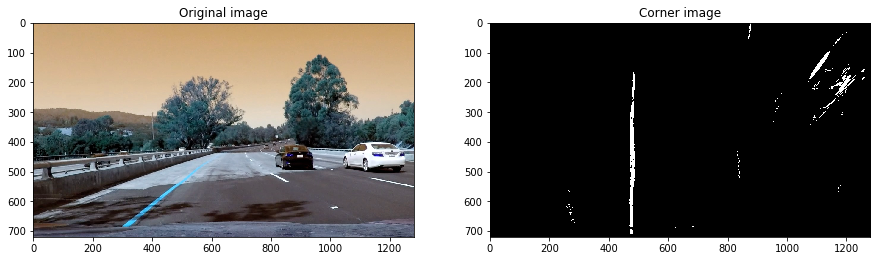

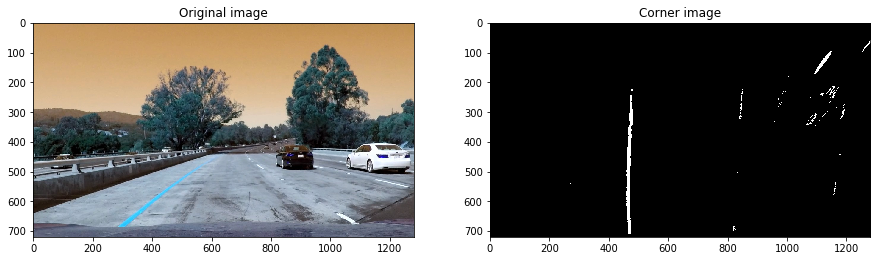

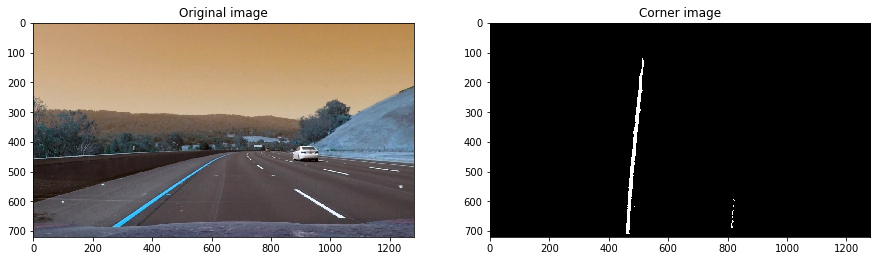

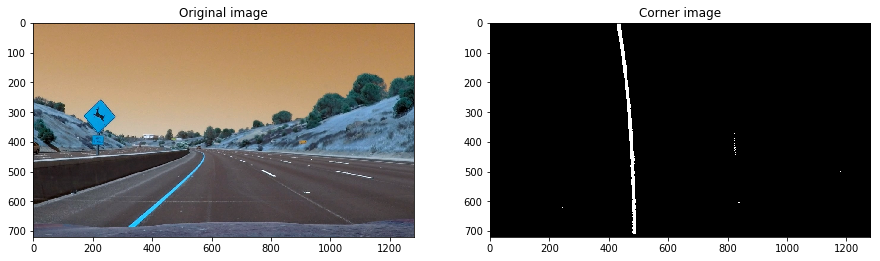

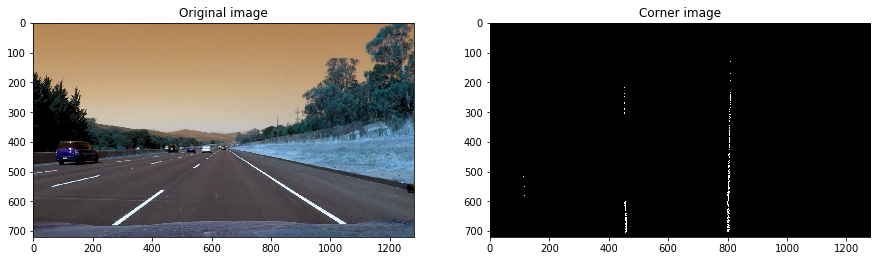

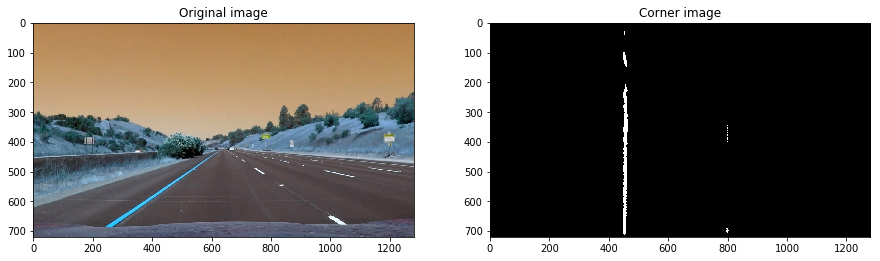

In [33]:
def pipeline(img):
    image = np.copy(img)
    image = cal_undistort(image)
    unwarped, M, Minv = warp(image)
    thresh = (190, 240)
    image_hlsS, image_hlsL = hls_thresh(unwarped, thresh)
    thresh = (25, 100)
    image_lab = lab_thresh(unwarped, thresh)
    
    image_luv, image_luvv = luv_thresh(unwarped) 
    combined_binary = np.zeros_like(image_hlsS)
    combined_binary[(image_hlsS == 1)  |(image_lab == 1) ] = 1
    
    return combined_binary, Minv


for img in imgHolder:
    image = cv2.imread(img)
    result, Minv = pipeline(image)
    f, (axs1, axs2) = plt.subplots(1, 2, figsize=(15,11))
    axs1.set_title("Original image")
    axs1.imshow(image)
    axs2.set_title("Corner image")
    axs2.imshow(result, cmap='gray')

print("Completed")

### step - 8. Line Finding

### Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?
Solution -
The functions sliding_window and advanceLane, which helps in identifying lane lines and fit a second order polynomial to both right and left lane lines.
The first step - Computes a histogram of the bottom half of the image and finds the bottom-most x position (or "base") of the left and right lane lines.
With this histogram I am adding up the pixel values along each column in the image. In my thresholded binary image, pixels are either 0 or 1, so the two most prominent peaks in this histogram will be good indicators of the x-position of the base of the lane lines. I can use that as a starting point for where to search for the lines. From that point, I can use a sliding window, placed around the line centers, to find and follow the lines up to the top of the frame.
Next doing the search along the margin aorund the previous line position detected in the sliding window.
And then doing the visualization for both of them.

Completed


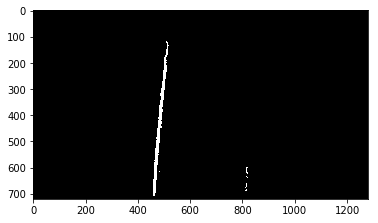

In [34]:
inputImage = cv2.imread('./test_images/test3.jpg')
testWarpedImg, Minv = pipeline(inputImage)
plt.imshow(testWarpedImg, cmap='gray')
print("Completed")

Completed


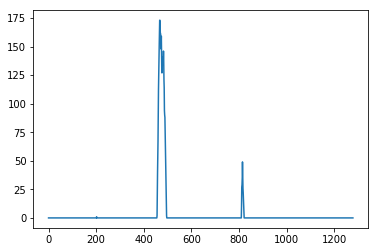

In [35]:
import numpy as np
histogram = np.sum(testWarpedImg[testWarpedImg.shape[0]//2:,:], axis=0)
plt.plot(histogram)
print("Completed")

In [36]:
# Define method to fit polynomial to binary image with lines extracted, using sliding window
def sliding_window(img):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)

    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint]) 
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint


    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    visualization_data = (rectangle_data, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data
print("Completed")

Completed


Completed


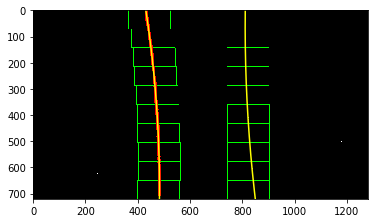

In [37]:
### Visualization
test = cv2.imread('./test_images/test2.jpg')
test_image, Minv = pipeline(test)
    
left_fit, right_fit, left_lane_inds, right_lane_inds, rectangles_data = sliding_window(test_image)

left_fit_x_int = left_fit[0]*(test_image.shape[0])**2 + left_fit[1]*test_image.shape[0] + left_fit[2]
right_fit_x_int = right_fit[0]*test_image.shape[0]**2 + right_fit[1]*test_image.shape[0] + right_fit[2]

rectangles = rectangles_data[0]
histogram = rectangles_data[1]

# Create an output image to draw on and  visualize the result
out_img = np.uint8(np.dstack((test_image, test_image, test_image))*255)
# Generate x and y values for plotting
ploty = np.linspace(0, test_image.shape[0]-1, test_image.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

for rect in rectangles:
# Draw the windows on the visualization image
    cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
    cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
nonzero = test_image.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [100, 200, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

print("Completed")

In [38]:
def advance_fit_lane_prev(binary_warped, left_fit_prev, right_fit_prev):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

print("Completed")

Completed


Completed


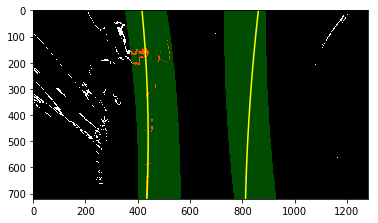

In [39]:
### Visualize
test2 = cv2.imread('./test_images/test5.jpg')
test2 = cv2.cvtColor(test2, cv2.COLOR_BGR2RGB)
test2_image, Minv = pipeline(test2)   
margin = 80

left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = advance_fit_lane_prev(test2_image, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, test2_image.shape[0]-1, test2_image.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]

# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((test2_image, test2_image, test2_image))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
nonzero = test2_image.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]

# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
print("Completed")

In [40]:
### get radius of curvature
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)

    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(test_image, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')


print("Completed")

Radius of curvature for example: 421.508514634 m, 532.047283726 m
Distance from lane center for example: -0.257755263887 m
Completed


In [41]:
def put_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result
print("Completed")

Completed


### Provide an example image of your result plotted back down onto the road such that the lane area is identified clearly.
The above image shows clearly that lane is detected properly
Drew the lane on the original image.
The step below i have drawn the calculation for curvature and radius on top of the imagepipeline image.

Completed


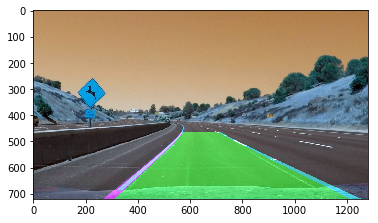

In [42]:
output_image_lane = put_lane(test, test_image, left_fit, right_fit, Minv)
plt.imshow(output_image_lane)

print("Completed")

Completed


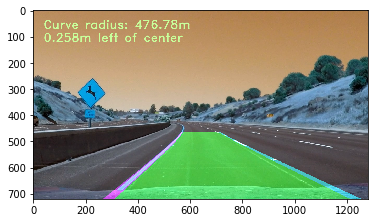

In [43]:
def put_data(image,  curv_rad, center_dist):
    new_img = np.copy(image)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

output_image_lane = put_data(output_image_lane,(rad_l+rad_r)/2, d_center)
plt.imshow(output_image_lane)

print("Completed")

### Applying the pipeline to all the images

In [44]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
        
        
    def add_fit(self, fit, inds):
        if fit is not None:
            if self.best_fit is not None:
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)

print("Completed")

Completed


Completed


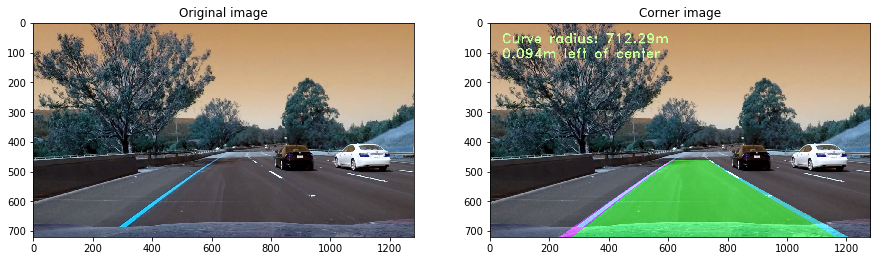

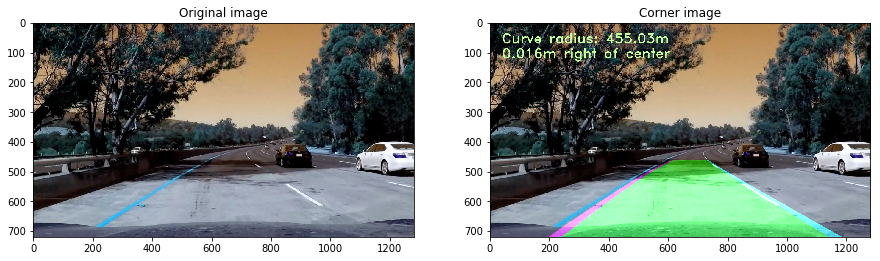

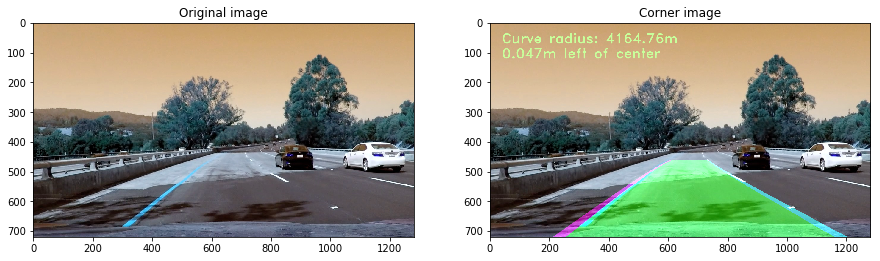

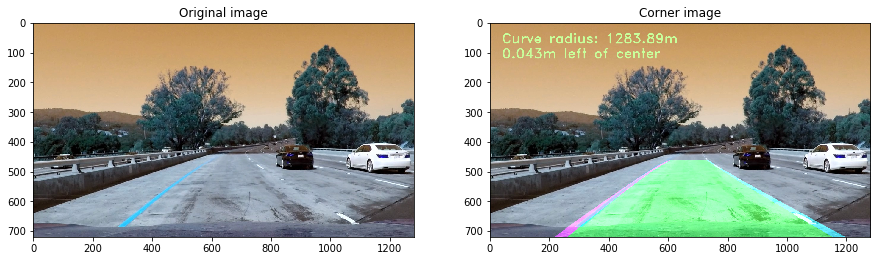

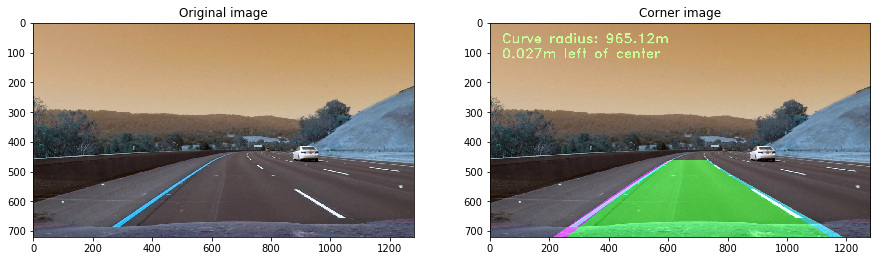

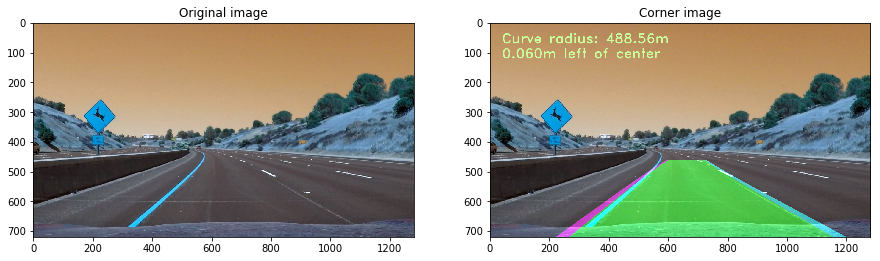

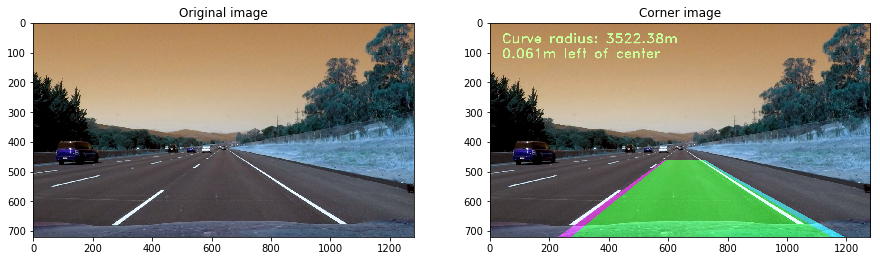

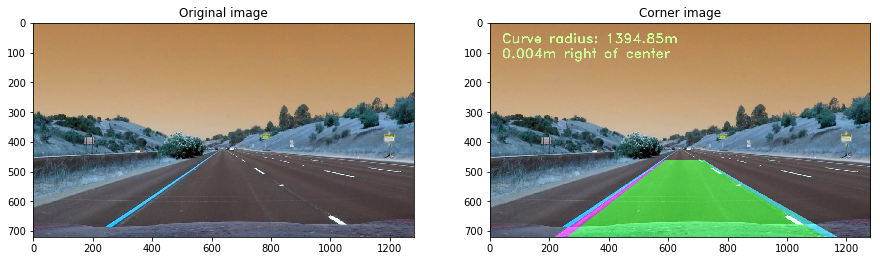

In [45]:
def image_pipeline(img):
    new_img = np.copy(img)
    img_bin, Minv = pipeline(new_img)
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = advance_fit_lane_prev(img_bin, l_line.best_fit, r_line.best_fit)
    if l_fit is not None and r_fit is not None:
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = put_lane(new_img, img_bin, l_line.best_fit, r_line.best_fit, Minv)
        rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(img_bin, l_line.best_fit, r_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        img_out = put_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
    return img_out


l_line = Line()
r_line = Line()

for img in imgHolder:
    image = cv2.imread(img)
    result= image_pipeline(image)
    f, (axs1, axs2) = plt.subplots(1, 2, figsize=(15,11))
    axs1.set_title("Original image")
    axs1.imshow(image)
    axs2.set_title("Corner image")
    axs2.imshow(result)

print("Completed")

Completed


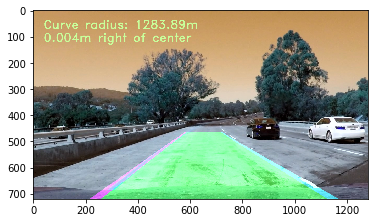

In [46]:
def process_images(img):
    result = image_pipeline(img)
    return result

finalTest = cv2.imread('./test_images/test1.jpg')
finalResult = process_images(finalTest)
plt.imshow(finalResult)
print("Completed")

### Briefly discuss any problems / issues you faced in your implementation of this project. Where will your pipeline likely fail? What could you do to make it more robust?
Solution - The above pipeline was able to detect the lane quite appropriately on the test video. But it faces some issues with the harder video input.
Was not able to correctly resolve the issue with thresholding, although this issue can be resolved with some experimentation.
Other issues is due to the image lighting issues, Not all the thresholds work properly on all the images.
This project has been fun to implement with different ways to implement and different ways to improve.
We can do some more operations on the images to enhance the lighting and other operations to improve the image so that it is better to detect the lane lines.

In [47]:
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML
l_line = Line()
r_line = Line()

video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(process_images)
%time processed_video.write_videofile(video_output1, audio=False)


[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [01:12<00:00, 18.10it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 1min 52s, sys: 5.23 s, total: 1min 57s
Wall time: 1min 13s


In [48]:
video_output1 = 'harder_output.mp4'
video_input1 = VideoFileClip('harder_challenge_video.mp4')
processed_video = video_input1.fl_image(process_images)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video harder_output.mp4
[MoviePy] Writing video harder_output.mp4


100%|█████████▉| 1199/1200 [01:16<00:00, 15.78it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_output.mp4 

CPU times: user 1min 55s, sys: 5.81 s, total: 2min
Wall time: 1min 16s


Link to the videos
1. https://youtu.be/yy3Ei6wInq4
2. https://youtu.be/_Q4eAMgk42U